# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

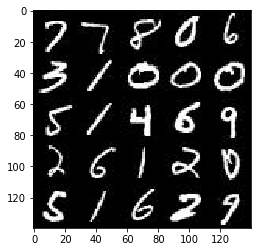

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

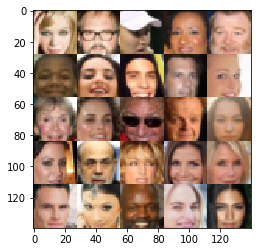

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1


/home/tstrader/anaconda3/envs/dl/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [8]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    input_images = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_images')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return input_images, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [19]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x?
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.nn.relu(x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.nn.relu(bn2)
        # 7x7x128
        #print('x2 = ', x2.shape)
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.nn.relu(bn3)
        # 4x4x256
        #print('x3 = ', x3.shape)

        # Flatten it
        shape = tf.shape(relu3)
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [55]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.nn.relu(x1)
        # 4x4x512 now
        #print('x1 = ', x1.shape)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.nn.relu(x2)
        # 8x8x256 now
        #print('x2 = ', x2.shape)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.nn.relu(x3)
        # 16x16x128 now
        #print('x3 = ', x3.shape)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        logits = tf.image.resize_images(logits, (28, 28))
        # 28x28x? now
        #print('logits = ', logits.shape)
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [59]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [57]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [58]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [81]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    print_every = 4
    show_every = 16
    out_channel_dim = 3 if data_image_mode == "RGB" else 1
    
    input_images, input_z, lr = model_inputs(data_shape[1], data_shape[2],
                                                                    data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_images, input_z, out_channel_dim)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)

    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_images: batch_images, input_z: batch_z,
                                                     lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_images: batch_images, input_z: batch_z,
                                                     lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_images: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, out_channel_dim, data_image_mode)
                    
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.2119... Generator Loss: 0.5908
Epoch 1/2... Discriminator Loss: 0.4370... Generator Loss: 1.4251
Epoch 1/2... Discriminator Loss: 0.4620... Generator Loss: 1.2181
Epoch 1/2... Discriminator Loss: 0.3866... Generator Loss: 1.5312


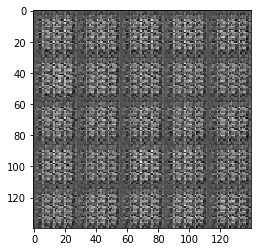

Epoch 1/2... Discriminator Loss: 0.6533... Generator Loss: 1.2003
Epoch 1/2... Discriminator Loss: 0.6114... Generator Loss: 1.8102
Epoch 1/2... Discriminator Loss: 0.8097... Generator Loss: 2.1786
Epoch 1/2... Discriminator Loss: 0.5590... Generator Loss: 1.5584


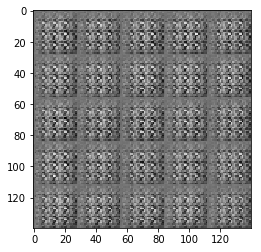

Epoch 1/2... Discriminator Loss: 0.8319... Generator Loss: 1.2095
Epoch 1/2... Discriminator Loss: 0.4578... Generator Loss: 1.6765
Epoch 1/2... Discriminator Loss: 0.7099... Generator Loss: 1.3120
Epoch 1/2... Discriminator Loss: 0.7972... Generator Loss: 1.1169


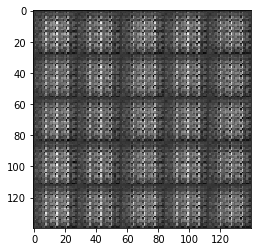

Epoch 1/2... Discriminator Loss: 0.2849... Generator Loss: 2.3852
Epoch 1/2... Discriminator Loss: 0.3335... Generator Loss: 1.8216
Epoch 1/2... Discriminator Loss: 0.6825... Generator Loss: 3.3595
Epoch 1/2... Discriminator Loss: 0.2697... Generator Loss: 1.9921


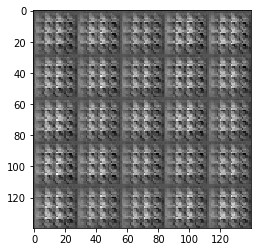

Epoch 1/2... Discriminator Loss: 0.2967... Generator Loss: 2.0517
Epoch 1/2... Discriminator Loss: 0.2168... Generator Loss: 2.4025
Epoch 1/2... Discriminator Loss: 0.1673... Generator Loss: 2.5263
Epoch 1/2... Discriminator Loss: 0.3245... Generator Loss: 2.1108


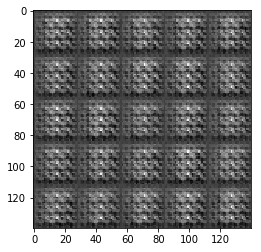

Epoch 1/2... Discriminator Loss: 0.3907... Generator Loss: 1.7205
Epoch 1/2... Discriminator Loss: 0.2891... Generator Loss: 3.2565
Epoch 1/2... Discriminator Loss: 0.5028... Generator Loss: 1.3938
Epoch 1/2... Discriminator Loss: 0.2970... Generator Loss: 1.9682


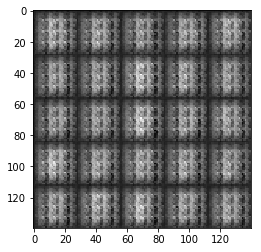

Epoch 1/2... Discriminator Loss: 0.4145... Generator Loss: 1.7833
Epoch 1/2... Discriminator Loss: 0.3647... Generator Loss: 1.8905
Epoch 1/2... Discriminator Loss: 0.1788... Generator Loss: 2.6124
Epoch 1/2... Discriminator Loss: 0.2160... Generator Loss: 2.2816


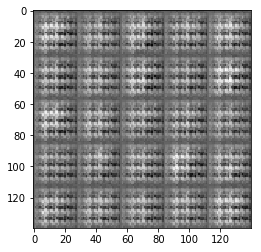

Epoch 1/2... Discriminator Loss: 0.1710... Generator Loss: 2.4026
Epoch 1/2... Discriminator Loss: 0.1611... Generator Loss: 2.7670
Epoch 1/2... Discriminator Loss: 0.5452... Generator Loss: 2.3471
Epoch 1/2... Discriminator Loss: 0.3028... Generator Loss: 1.9291


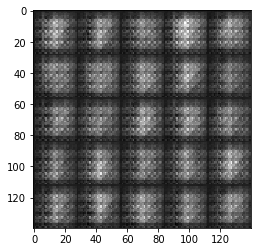

Epoch 1/2... Discriminator Loss: 0.2822... Generator Loss: 2.7934
Epoch 1/2... Discriminator Loss: 0.2149... Generator Loss: 2.3659
Epoch 1/2... Discriminator Loss: 0.1614... Generator Loss: 3.0717
Epoch 1/2... Discriminator Loss: 0.1917... Generator Loss: 2.5749


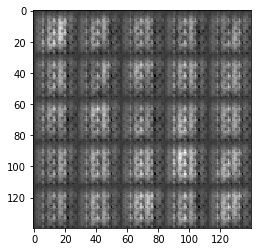

Epoch 1/2... Discriminator Loss: 0.5089... Generator Loss: 1.2735
Epoch 1/2... Discriminator Loss: 0.1539... Generator Loss: 3.1529
Epoch 1/2... Discriminator Loss: 0.3090... Generator Loss: 2.1932
Epoch 1/2... Discriminator Loss: 0.2876... Generator Loss: 2.2032


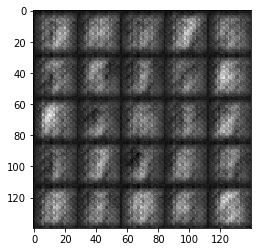

Epoch 1/2... Discriminator Loss: 0.3009... Generator Loss: 2.4506
Epoch 1/2... Discriminator Loss: 0.2753... Generator Loss: 2.6754
Epoch 1/2... Discriminator Loss: 0.4467... Generator Loss: 2.4219
Epoch 1/2... Discriminator Loss: 0.2854... Generator Loss: 2.1583


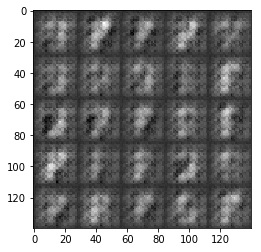

Epoch 1/2... Discriminator Loss: 0.5576... Generator Loss: 3.6157
Epoch 1/2... Discriminator Loss: 0.4850... Generator Loss: 3.2181
Epoch 1/2... Discriminator Loss: 0.3045... Generator Loss: 2.2149
Epoch 1/2... Discriminator Loss: 0.3590... Generator Loss: 1.8875


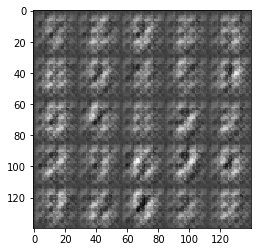

Epoch 1/2... Discriminator Loss: 0.3202... Generator Loss: 2.1039
Epoch 1/2... Discriminator Loss: 0.3373... Generator Loss: 1.8121
Epoch 1/2... Discriminator Loss: 0.3403... Generator Loss: 1.8773
Epoch 1/2... Discriminator Loss: 0.3105... Generator Loss: 2.0930


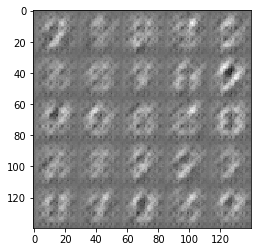

Epoch 1/2... Discriminator Loss: 0.2692... Generator Loss: 2.6097
Epoch 1/2... Discriminator Loss: 0.2194... Generator Loss: 2.4659
Epoch 1/2... Discriminator Loss: 0.3161... Generator Loss: 1.9411
Epoch 1/2... Discriminator Loss: 0.4147... Generator Loss: 1.5344


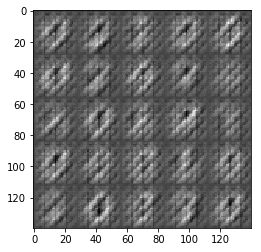

Epoch 1/2... Discriminator Loss: 1.4113... Generator Loss: 0.4382
Epoch 1/2... Discriminator Loss: 0.4321... Generator Loss: 1.8821
Epoch 1/2... Discriminator Loss: 0.2516... Generator Loss: 2.5745
Epoch 1/2... Discriminator Loss: 0.2755... Generator Loss: 2.3845


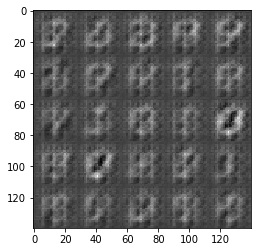

Epoch 1/2... Discriminator Loss: 0.2722... Generator Loss: 2.4923
Epoch 1/2... Discriminator Loss: 0.3716... Generator Loss: 3.0079
Epoch 1/2... Discriminator Loss: 0.3892... Generator Loss: 1.7041
Epoch 1/2... Discriminator Loss: 0.3165... Generator Loss: 1.9291


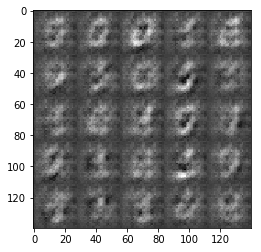

Epoch 1/2... Discriminator Loss: 0.4336... Generator Loss: 2.5446
Epoch 1/2... Discriminator Loss: 0.3846... Generator Loss: 2.0123
Epoch 1/2... Discriminator Loss: 1.5152... Generator Loss: 0.2993
Epoch 1/2... Discriminator Loss: 0.4224... Generator Loss: 2.5178


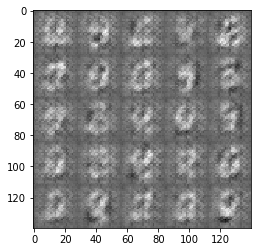

Epoch 1/2... Discriminator Loss: 0.5226... Generator Loss: 3.7438
Epoch 1/2... Discriminator Loss: 1.0089... Generator Loss: 0.6361
Epoch 1/2... Discriminator Loss: 0.3225... Generator Loss: 2.4197
Epoch 1/2... Discriminator Loss: 0.3508... Generator Loss: 1.8210


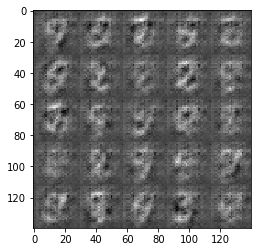

Epoch 1/2... Discriminator Loss: 0.9743... Generator Loss: 0.6153
Epoch 1/2... Discriminator Loss: 0.3287... Generator Loss: 2.5473
Epoch 1/2... Discriminator Loss: 0.4516... Generator Loss: 2.1205
Epoch 1/2... Discriminator Loss: 0.5267... Generator Loss: 1.3477


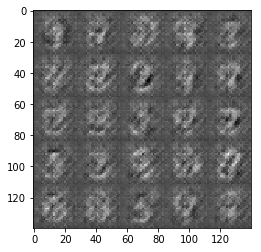

Epoch 1/2... Discriminator Loss: 0.6804... Generator Loss: 0.9350
Epoch 1/2... Discriminator Loss: 0.6118... Generator Loss: 1.1000
Epoch 1/2... Discriminator Loss: 0.6229... Generator Loss: 1.1052
Epoch 1/2... Discriminator Loss: 0.6004... Generator Loss: 1.1603


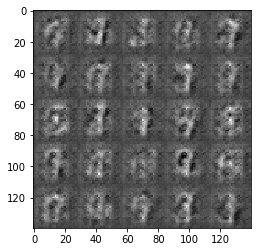

Epoch 1/2... Discriminator Loss: 0.4271... Generator Loss: 1.5822
Epoch 1/2... Discriminator Loss: 0.3251... Generator Loss: 2.2076
Epoch 1/2... Discriminator Loss: 0.3706... Generator Loss: 1.7173
Epoch 1/2... Discriminator Loss: 0.2422... Generator Loss: 2.3640


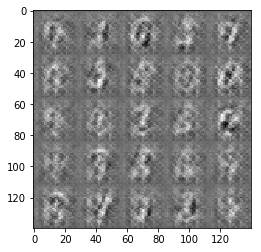

Epoch 1/2... Discriminator Loss: 0.3098... Generator Loss: 2.1455
Epoch 1/2... Discriminator Loss: 0.3868... Generator Loss: 1.6723
Epoch 1/2... Discriminator Loss: 0.3047... Generator Loss: 2.2975
Epoch 1/2... Discriminator Loss: 0.3279... Generator Loss: 2.0483


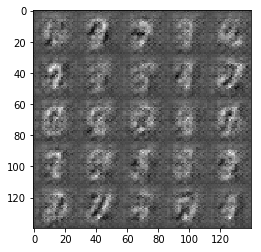

Epoch 1/2... Discriminator Loss: 0.2987... Generator Loss: 2.7142
Epoch 1/2... Discriminator Loss: 0.3090... Generator Loss: 2.7569
Epoch 1/2... Discriminator Loss: 0.3308... Generator Loss: 1.7313
Epoch 1/2... Discriminator Loss: 0.3087... Generator Loss: 1.8626


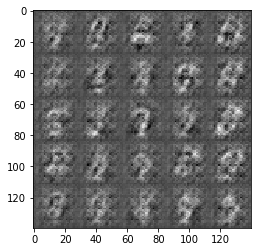

Epoch 1/2... Discriminator Loss: 0.3004... Generator Loss: 2.0255
Epoch 1/2... Discriminator Loss: 0.4167... Generator Loss: 1.5105
Epoch 1/2... Discriminator Loss: 0.5992... Generator Loss: 1.0485
Epoch 1/2... Discriminator Loss: 0.3325... Generator Loss: 1.9601


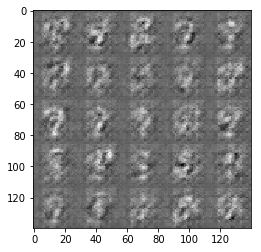

Epoch 1/2... Discriminator Loss: 0.2856... Generator Loss: 2.0452
Epoch 1/2... Discriminator Loss: 0.3190... Generator Loss: 1.7803
Epoch 1/2... Discriminator Loss: 0.2954... Generator Loss: 2.0741
Epoch 1/2... Discriminator Loss: 0.2720... Generator Loss: 1.9660


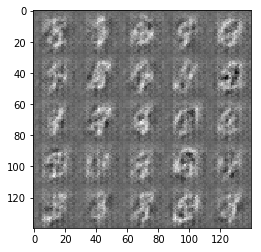

Epoch 1/2... Discriminator Loss: 0.2763... Generator Loss: 2.0692
Epoch 1/2... Discriminator Loss: 0.2465... Generator Loss: 2.5326
Epoch 1/2... Discriminator Loss: 0.2284... Generator Loss: 2.3797
Epoch 1/2... Discriminator Loss: 0.2022... Generator Loss: 2.4133


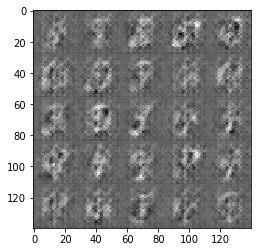

Epoch 1/2... Discriminator Loss: 0.2413... Generator Loss: 2.5056
Epoch 1/2... Discriminator Loss: 0.2415... Generator Loss: 2.7273
Epoch 1/2... Discriminator Loss: 0.3481... Generator Loss: 3.9433
Epoch 1/2... Discriminator Loss: 0.2735... Generator Loss: 1.8611


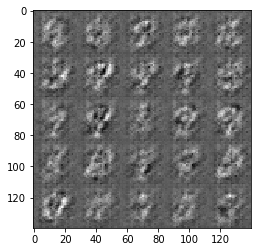

Epoch 1/2... Discriminator Loss: 0.2123... Generator Loss: 2.3831
Epoch 1/2... Discriminator Loss: 0.2369... Generator Loss: 3.1941
Epoch 1/2... Discriminator Loss: 0.2191... Generator Loss: 2.6453
Epoch 1/2... Discriminator Loss: 0.1561... Generator Loss: 2.9777


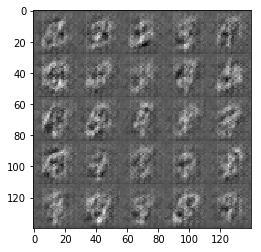

Epoch 1/2... Discriminator Loss: 0.5113... Generator Loss: 4.7617
Epoch 1/2... Discriminator Loss: 0.1987... Generator Loss: 3.4781
Epoch 1/2... Discriminator Loss: 0.2201... Generator Loss: 2.8911
Epoch 1/2... Discriminator Loss: 0.2315... Generator Loss: 2.2306


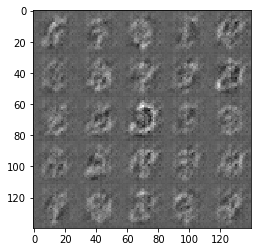

Epoch 1/2... Discriminator Loss: 0.1768... Generator Loss: 2.7946
Epoch 2/2... Discriminator Loss: 0.1698... Generator Loss: 2.8323
Epoch 2/2... Discriminator Loss: 0.1685... Generator Loss: 2.8475
Epoch 2/2... Discriminator Loss: 0.2190... Generator Loss: 2.4634


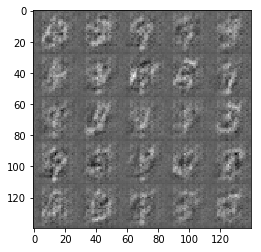

Epoch 2/2... Discriminator Loss: 0.2425... Generator Loss: 2.1609
Epoch 2/2... Discriminator Loss: 0.2052... Generator Loss: 2.7045
Epoch 2/2... Discriminator Loss: 0.4320... Generator Loss: 1.3496
Epoch 2/2... Discriminator Loss: 0.1805... Generator Loss: 2.9994


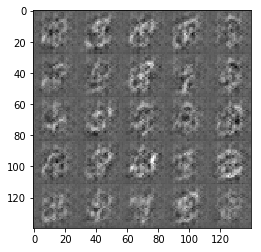

Epoch 2/2... Discriminator Loss: 0.2297... Generator Loss: 2.3175
Epoch 2/2... Discriminator Loss: 0.1919... Generator Loss: 2.7970
Epoch 2/2... Discriminator Loss: 0.2025... Generator Loss: 2.6529
Epoch 2/2... Discriminator Loss: 0.2100... Generator Loss: 2.4465


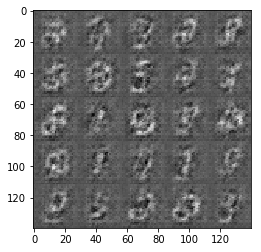

Epoch 2/2... Discriminator Loss: 0.1854... Generator Loss: 3.1555
Epoch 2/2... Discriminator Loss: 0.2064... Generator Loss: 2.2708
Epoch 2/2... Discriminator Loss: 0.2311... Generator Loss: 2.1859
Epoch 2/2... Discriminator Loss: 0.1949... Generator Loss: 2.3908


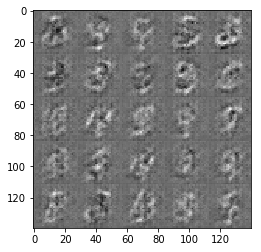

Epoch 2/2... Discriminator Loss: 0.2164... Generator Loss: 2.3159
Epoch 2/2... Discriminator Loss: 0.1670... Generator Loss: 2.5591
Epoch 2/2... Discriminator Loss: 0.2326... Generator Loss: 2.0184
Epoch 2/2... Discriminator Loss: 0.1592... Generator Loss: 3.0534


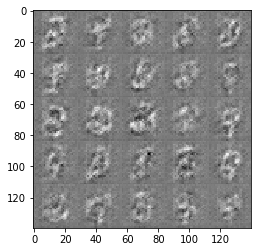

Epoch 2/2... Discriminator Loss: 0.2441... Generator Loss: 2.0770
Epoch 2/2... Discriminator Loss: 0.9476... Generator Loss: 0.6882
Epoch 2/2... Discriminator Loss: 0.3438... Generator Loss: 2.1082
Epoch 2/2... Discriminator Loss: 0.2859... Generator Loss: 2.0141


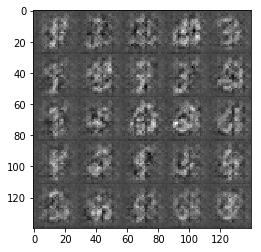

Epoch 2/2... Discriminator Loss: 0.2173... Generator Loss: 2.3669
Epoch 2/2... Discriminator Loss: 0.2114... Generator Loss: 2.5976
Epoch 2/2... Discriminator Loss: 0.1944... Generator Loss: 2.6818
Epoch 2/2... Discriminator Loss: 0.2263... Generator Loss: 2.2439


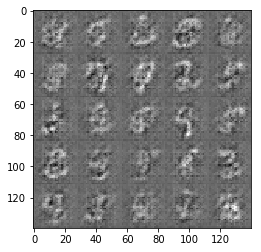

Epoch 2/2... Discriminator Loss: 0.1852... Generator Loss: 2.5216
Epoch 2/2... Discriminator Loss: 0.2092... Generator Loss: 2.3237
Epoch 2/2... Discriminator Loss: 0.2559... Generator Loss: 1.9926
Epoch 2/2... Discriminator Loss: 0.1835... Generator Loss: 2.4695


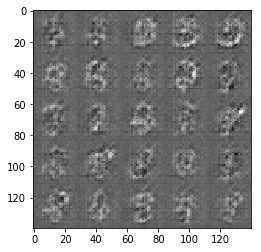

Epoch 2/2... Discriminator Loss: 0.2289... Generator Loss: 2.1395
Epoch 2/2... Discriminator Loss: 0.1880... Generator Loss: 3.0306
Epoch 2/2... Discriminator Loss: 0.1951... Generator Loss: 2.6737
Epoch 2/2... Discriminator Loss: 0.1539... Generator Loss: 2.8640


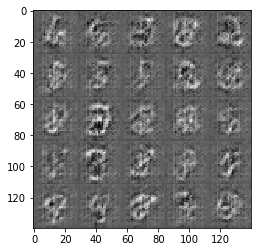

Epoch 2/2... Discriminator Loss: 0.1582... Generator Loss: 2.7016
Epoch 2/2... Discriminator Loss: 0.2149... Generator Loss: 2.3214
Epoch 2/2... Discriminator Loss: 0.3006... Generator Loss: 4.6842
Epoch 2/2... Discriminator Loss: 0.1471... Generator Loss: 2.7339


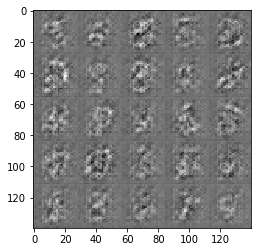

Epoch 2/2... Discriminator Loss: 0.1577... Generator Loss: 2.8086
Epoch 2/2... Discriminator Loss: 0.3074... Generator Loss: 1.7242
Epoch 2/2... Discriminator Loss: 0.1580... Generator Loss: 2.9768
Epoch 2/2... Discriminator Loss: 0.2593... Generator Loss: 1.9558


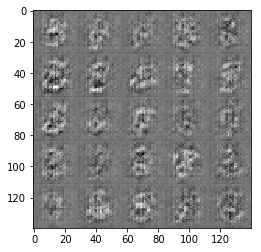

Epoch 2/2... Discriminator Loss: 0.2047... Generator Loss: 2.2752
Epoch 2/2... Discriminator Loss: 0.2459... Generator Loss: 2.0537
Epoch 2/2... Discriminator Loss: 0.1674... Generator Loss: 2.5886
Epoch 2/2... Discriminator Loss: 0.1777... Generator Loss: 2.6295


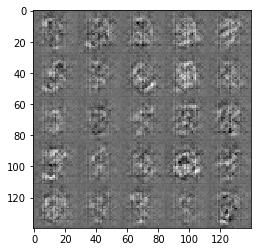

Epoch 2/2... Discriminator Loss: 0.1656... Generator Loss: 2.5258
Epoch 2/2... Discriminator Loss: 0.2002... Generator Loss: 2.2742
Epoch 2/2... Discriminator Loss: 0.2114... Generator Loss: 2.1859
Epoch 2/2... Discriminator Loss: 6.1228... Generator Loss: 0.0035


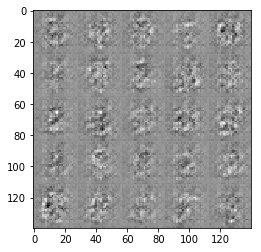

Epoch 2/2... Discriminator Loss: 2.2274... Generator Loss: 7.5958
Epoch 2/2... Discriminator Loss: 0.2386... Generator Loss: 2.1608
Epoch 2/2... Discriminator Loss: 0.2878... Generator Loss: 1.9044
Epoch 2/2... Discriminator Loss: 0.2166... Generator Loss: 2.3976


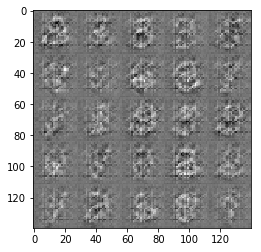

Epoch 2/2... Discriminator Loss: 0.2116... Generator Loss: 2.4045
Epoch 2/2... Discriminator Loss: 0.2386... Generator Loss: 2.2990
Epoch 2/2... Discriminator Loss: 0.2398... Generator Loss: 2.1274
Epoch 2/2... Discriminator Loss: 0.2375... Generator Loss: 2.0712


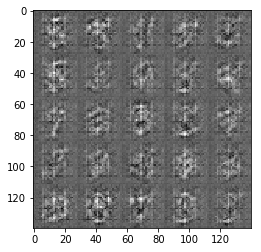

Epoch 2/2... Discriminator Loss: 0.1797... Generator Loss: 2.4126
Epoch 2/2... Discriminator Loss: 0.1921... Generator Loss: 2.5395
Epoch 2/2... Discriminator Loss: 0.1759... Generator Loss: 2.4544
Epoch 2/2... Discriminator Loss: 0.1710... Generator Loss: 2.6294


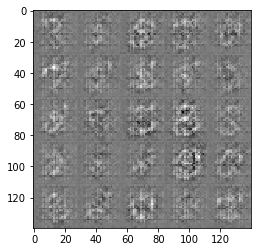

Epoch 2/2... Discriminator Loss: 0.1292... Generator Loss: 3.2571
Epoch 2/2... Discriminator Loss: 0.1796... Generator Loss: 2.4999
Epoch 2/2... Discriminator Loss: 0.1651... Generator Loss: 2.7774
Epoch 2/2... Discriminator Loss: 0.1350... Generator Loss: 3.0095


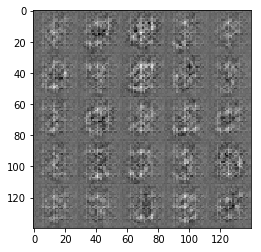

Epoch 2/2... Discriminator Loss: 0.1877... Generator Loss: 2.7210
Epoch 2/2... Discriminator Loss: 0.1925... Generator Loss: 2.5470
Epoch 2/2... Discriminator Loss: 0.2845... Generator Loss: 1.8063
Epoch 2/2... Discriminator Loss: 0.1235... Generator Loss: 2.8010


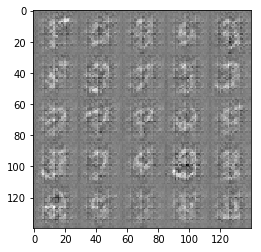

Epoch 2/2... Discriminator Loss: 0.1978... Generator Loss: 3.5080
Epoch 2/2... Discriminator Loss: 0.1699... Generator Loss: 2.5287
Epoch 2/2... Discriminator Loss: 0.1589... Generator Loss: 2.6719
Epoch 2/2... Discriminator Loss: 0.1689... Generator Loss: 2.5134


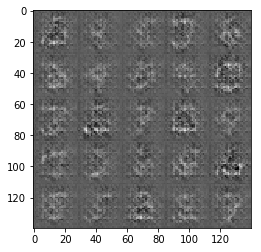

Epoch 2/2... Discriminator Loss: 0.1372... Generator Loss: 2.7893
Epoch 2/2... Discriminator Loss: 0.3457... Generator Loss: 4.3720
Epoch 2/2... Discriminator Loss: 0.3051... Generator Loss: 3.6477
Epoch 2/2... Discriminator Loss: 0.2848... Generator Loss: 2.2655


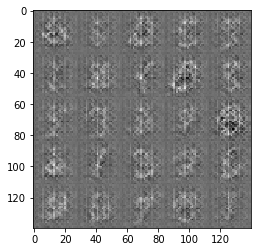

Epoch 2/2... Discriminator Loss: 0.4643... Generator Loss: 1.4104
Epoch 2/2... Discriminator Loss: 0.3069... Generator Loss: 2.0847
Epoch 2/2... Discriminator Loss: 0.2823... Generator Loss: 1.9463
Epoch 2/2... Discriminator Loss: 0.2576... Generator Loss: 2.3305


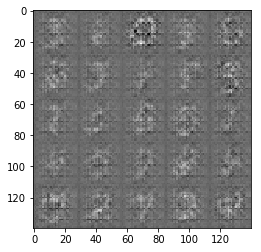

Epoch 2/2... Discriminator Loss: 0.2297... Generator Loss: 2.4227
Epoch 2/2... Discriminator Loss: 0.1925... Generator Loss: 2.5172
Epoch 2/2... Discriminator Loss: 0.2151... Generator Loss: 2.3410
Epoch 2/2... Discriminator Loss: 0.2037... Generator Loss: 3.1394


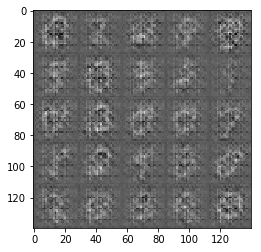

Epoch 2/2... Discriminator Loss: 0.2092... Generator Loss: 2.5171
Epoch 2/2... Discriminator Loss: 0.1765... Generator Loss: 2.4280
Epoch 2/2... Discriminator Loss: 0.2520... Generator Loss: 2.2459
Epoch 2/2... Discriminator Loss: 0.1956... Generator Loss: 2.5117


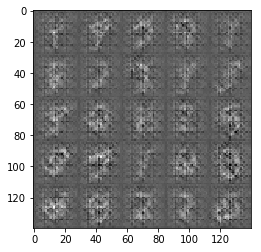

Epoch 2/2... Discriminator Loss: 0.2343... Generator Loss: 2.1213
Epoch 2/2... Discriminator Loss: 0.1046... Generator Loss: 3.7208
Epoch 2/2... Discriminator Loss: 0.1919... Generator Loss: 2.3085
Epoch 2/2... Discriminator Loss: 0.2952... Generator Loss: 1.7983


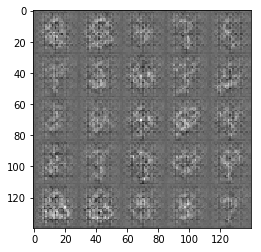

Epoch 2/2... Discriminator Loss: 0.1472... Generator Loss: 2.7136
Epoch 2/2... Discriminator Loss: 0.2418... Generator Loss: 2.1927
Epoch 2/2... Discriminator Loss: 0.4386... Generator Loss: 1.3470
Epoch 2/2... Discriminator Loss: 0.2341... Generator Loss: 2.0559


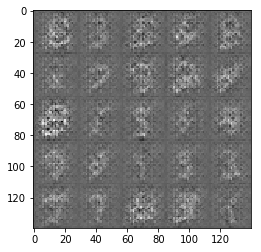

Epoch 2/2... Discriminator Loss: 0.1938... Generator Loss: 2.4429
Epoch 2/2... Discriminator Loss: 0.1113... Generator Loss: 3.0849
Epoch 2/2... Discriminator Loss: 0.2491... Generator Loss: 2.0301
Epoch 2/2... Discriminator Loss: 0.2053... Generator Loss: 2.3825


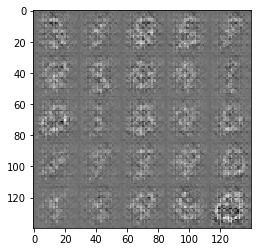

Epoch 2/2... Discriminator Loss: 0.1676... Generator Loss: 2.6814
Epoch 2/2... Discriminator Loss: 0.1780... Generator Loss: 2.8056
Epoch 2/2... Discriminator Loss: 0.1314... Generator Loss: 3.3058
Epoch 2/2... Discriminator Loss: 0.5778... Generator Loss: 5.8222


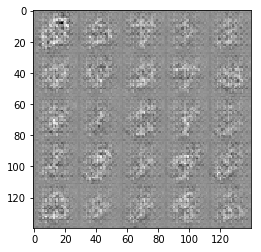

Epoch 2/2... Discriminator Loss: 0.3512... Generator Loss: 4.5010
Epoch 2/2... Discriminator Loss: 0.3290... Generator Loss: 2.2113
Epoch 2/2... Discriminator Loss: 0.3072... Generator Loss: 2.7925
Epoch 2/2... Discriminator Loss: 0.2651... Generator Loss: 2.2249


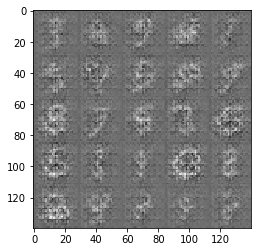

Epoch 2/2... Discriminator Loss: 0.1864... Generator Loss: 3.0037
Epoch 2/2... Discriminator Loss: 0.2504... Generator Loss: 2.2969
Epoch 2/2... Discriminator Loss: 0.2373... Generator Loss: 2.3861
Epoch 2/2... Discriminator Loss: 0.2617... Generator Loss: 2.0436


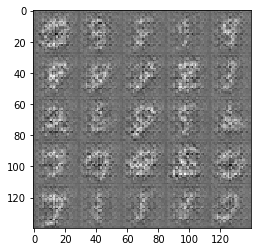

Epoch 2/2... Discriminator Loss: 0.2384... Generator Loss: 2.1745
Epoch 2/2... Discriminator Loss: 0.2411... Generator Loss: 2.2864


In [82]:
batch_size = 128
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.9779... Generator Loss: 0.2938
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 0.5437
Epoch 1/1... Discriminator Loss: 0.5400... Generator Loss: 1.4350
Epoch 1/1... Discriminator Loss: 0.5719... Generator Loss: 1.3176


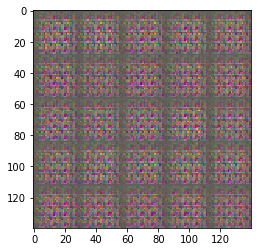

Epoch 1/1... Discriminator Loss: 0.5736... Generator Loss: 1.4005
Epoch 1/1... Discriminator Loss: 0.4933... Generator Loss: 1.5318
Epoch 1/1... Discriminator Loss: 0.3900... Generator Loss: 1.5482
Epoch 1/1... Discriminator Loss: 0.4653... Generator Loss: 1.5803


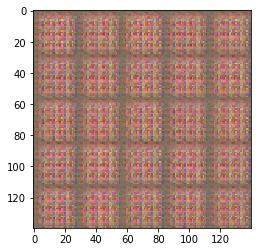

Epoch 1/1... Discriminator Loss: 0.3392... Generator Loss: 1.8948
Epoch 1/1... Discriminator Loss: 0.3451... Generator Loss: 1.9827
Epoch 1/1... Discriminator Loss: 0.3802... Generator Loss: 1.7168
Epoch 1/1... Discriminator Loss: 0.2827... Generator Loss: 2.1628


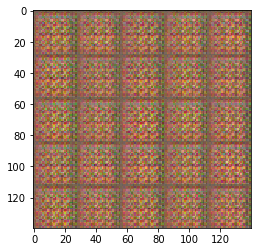

Epoch 1/1... Discriminator Loss: 0.2711... Generator Loss: 2.1762
Epoch 1/1... Discriminator Loss: 0.2915... Generator Loss: 2.1257
Epoch 1/1... Discriminator Loss: 0.3548... Generator Loss: 1.9213
Epoch 1/1... Discriminator Loss: 0.4423... Generator Loss: 1.7545


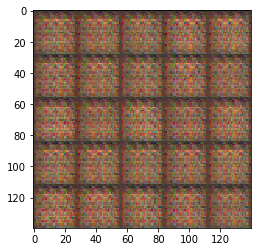

Epoch 1/1... Discriminator Loss: 0.2954... Generator Loss: 2.2715
Epoch 1/1... Discriminator Loss: 0.2374... Generator Loss: 2.3053
Epoch 1/1... Discriminator Loss: 0.4213... Generator Loss: 1.7137
Epoch 1/1... Discriminator Loss: 0.4919... Generator Loss: 1.8577


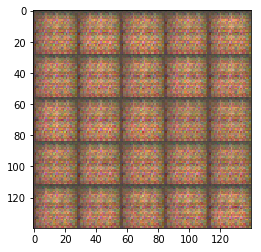

Epoch 1/1... Discriminator Loss: 0.4172... Generator Loss: 1.7699
Epoch 1/1... Discriminator Loss: 0.2734... Generator Loss: 2.2978
Epoch 1/1... Discriminator Loss: 0.5272... Generator Loss: 1.5530
Epoch 1/1... Discriminator Loss: 0.8504... Generator Loss: 4.7439


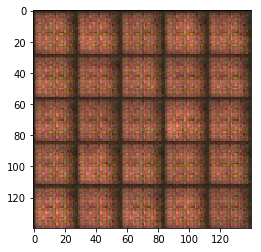

Epoch 1/1... Discriminator Loss: 0.4456... Generator Loss: 2.2924
Epoch 1/1... Discriminator Loss: 0.9251... Generator Loss: 0.8490
Epoch 1/1... Discriminator Loss: 0.8138... Generator Loss: 2.2798
Epoch 1/1... Discriminator Loss: 0.4949... Generator Loss: 1.8930


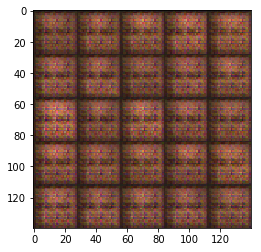

Epoch 1/1... Discriminator Loss: 0.4523... Generator Loss: 1.8168
Epoch 1/1... Discriminator Loss: 0.8966... Generator Loss: 1.3654
Epoch 1/1... Discriminator Loss: 1.1476... Generator Loss: 3.2224
Epoch 1/1... Discriminator Loss: 0.7154... Generator Loss: 1.3025


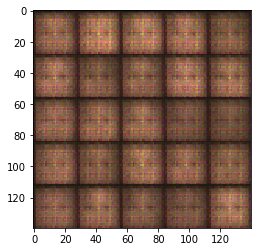

Epoch 1/1... Discriminator Loss: 0.7210... Generator Loss: 1.4097
Epoch 1/1... Discriminator Loss: 0.6369... Generator Loss: 1.1695
Epoch 1/1... Discriminator Loss: 0.8465... Generator Loss: 2.6633
Epoch 1/1... Discriminator Loss: 0.6327... Generator Loss: 1.1326


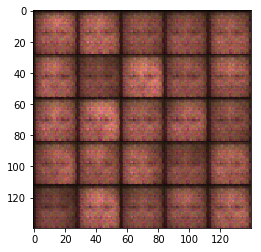

Epoch 1/1... Discriminator Loss: 0.5631... Generator Loss: 1.4822
Epoch 1/1... Discriminator Loss: 0.6240... Generator Loss: 1.8268
Epoch 1/1... Discriminator Loss: 0.6821... Generator Loss: 1.3036
Epoch 1/1... Discriminator Loss: 0.6471... Generator Loss: 1.3159


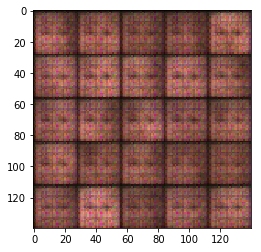

Epoch 1/1... Discriminator Loss: 0.9188... Generator Loss: 1.0300
Epoch 1/1... Discriminator Loss: 0.5802... Generator Loss: 1.5005
Epoch 1/1... Discriminator Loss: 0.8145... Generator Loss: 2.0024
Epoch 1/1... Discriminator Loss: 0.7862... Generator Loss: 2.5551


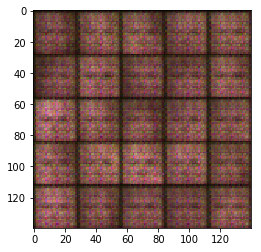

Epoch 1/1... Discriminator Loss: 0.9643... Generator Loss: 1.2870
Epoch 1/1... Discriminator Loss: 0.8698... Generator Loss: 1.2908
Epoch 1/1... Discriminator Loss: 0.7906... Generator Loss: 1.2258
Epoch 1/1... Discriminator Loss: 0.5887... Generator Loss: 1.3856


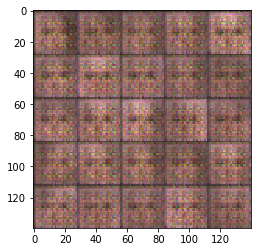

Epoch 1/1... Discriminator Loss: 1.0201... Generator Loss: 1.1328
Epoch 1/1... Discriminator Loss: 1.6039... Generator Loss: 0.3284
Epoch 1/1... Discriminator Loss: 1.1328... Generator Loss: 1.0677
Epoch 1/1... Discriminator Loss: 0.9803... Generator Loss: 1.2558


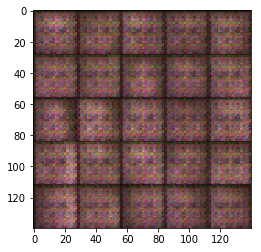

Epoch 1/1... Discriminator Loss: 0.8062... Generator Loss: 1.5339
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 1.5694
Epoch 1/1... Discriminator Loss: 0.8402... Generator Loss: 1.4182
Epoch 1/1... Discriminator Loss: 1.0377... Generator Loss: 0.9660


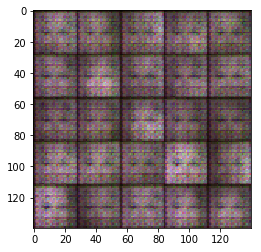

Epoch 1/1... Discriminator Loss: 1.0179... Generator Loss: 1.0447
Epoch 1/1... Discriminator Loss: 0.4908... Generator Loss: 1.7439
Epoch 1/1... Discriminator Loss: 1.1590... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 0.8045... Generator Loss: 1.3981


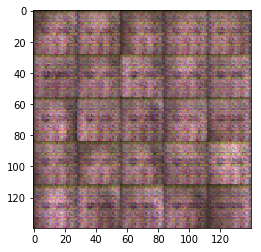

Epoch 1/1... Discriminator Loss: 1.0435... Generator Loss: 0.9503
Epoch 1/1... Discriminator Loss: 0.8587... Generator Loss: 1.2571
Epoch 1/1... Discriminator Loss: 1.0467... Generator Loss: 0.8305
Epoch 1/1... Discriminator Loss: 0.9497... Generator Loss: 1.2878


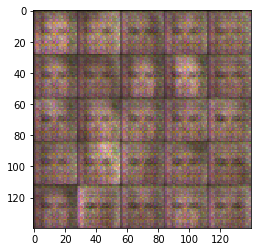

Epoch 1/1... Discriminator Loss: 0.7287... Generator Loss: 1.5142
Epoch 1/1... Discriminator Loss: 0.7733... Generator Loss: 1.2806
Epoch 1/1... Discriminator Loss: 1.0240... Generator Loss: 1.6191
Epoch 1/1... Discriminator Loss: 0.9262... Generator Loss: 1.0193


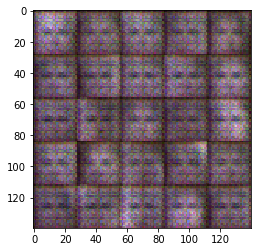

Epoch 1/1... Discriminator Loss: 0.7792... Generator Loss: 1.2650
Epoch 1/1... Discriminator Loss: 0.8538... Generator Loss: 1.4654
Epoch 1/1... Discriminator Loss: 0.9521... Generator Loss: 0.9860
Epoch 1/1... Discriminator Loss: 0.7341... Generator Loss: 1.3688


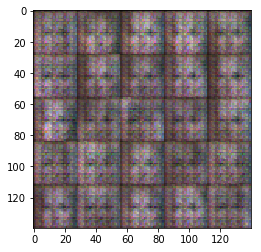

Epoch 1/1... Discriminator Loss: 0.7777... Generator Loss: 1.6252
Epoch 1/1... Discriminator Loss: 0.8237... Generator Loss: 1.1457
Epoch 1/1... Discriminator Loss: 1.1101... Generator Loss: 0.8151
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 1.5097


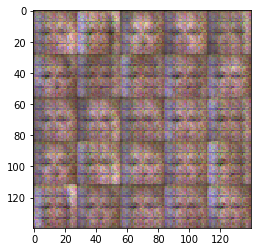

Epoch 1/1... Discriminator Loss: 0.7031... Generator Loss: 1.3494
Epoch 1/1... Discriminator Loss: 0.8399... Generator Loss: 1.3869
Epoch 1/1... Discriminator Loss: 0.8690... Generator Loss: 1.1731
Epoch 1/1... Discriminator Loss: 0.7986... Generator Loss: 1.0840


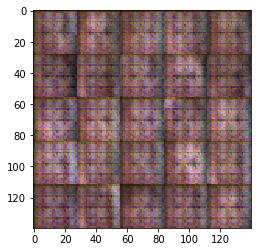

Epoch 1/1... Discriminator Loss: 0.6672... Generator Loss: 1.6312
Epoch 1/1... Discriminator Loss: 0.6665... Generator Loss: 1.3867
Epoch 1/1... Discriminator Loss: 0.9016... Generator Loss: 1.2292
Epoch 1/1... Discriminator Loss: 0.8445... Generator Loss: 1.1746


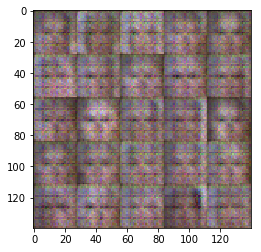

Epoch 1/1... Discriminator Loss: 0.6948... Generator Loss: 1.4394
Epoch 1/1... Discriminator Loss: 0.7961... Generator Loss: 1.2754
Epoch 1/1... Discriminator Loss: 0.6472... Generator Loss: 2.0438
Epoch 1/1... Discriminator Loss: 0.8845... Generator Loss: 1.3711


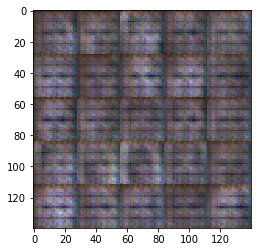

Epoch 1/1... Discriminator Loss: 0.7981... Generator Loss: 1.4832
Epoch 1/1... Discriminator Loss: 0.7339... Generator Loss: 1.1294
Epoch 1/1... Discriminator Loss: 0.6697... Generator Loss: 1.7265
Epoch 1/1... Discriminator Loss: 0.7625... Generator Loss: 1.3879


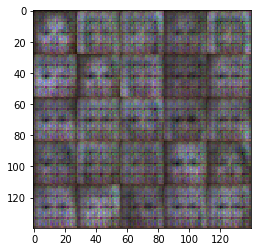

Epoch 1/1... Discriminator Loss: 0.8413... Generator Loss: 1.0107
Epoch 1/1... Discriminator Loss: 0.5470... Generator Loss: 1.6602
Epoch 1/1... Discriminator Loss: 1.9345... Generator Loss: 3.5160
Epoch 1/1... Discriminator Loss: 1.0265... Generator Loss: 1.3692


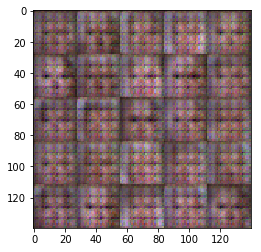

Epoch 1/1... Discriminator Loss: 1.0249... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 0.6130... Generator Loss: 1.5711
Epoch 1/1... Discriminator Loss: 0.7111... Generator Loss: 1.2284
Epoch 1/1... Discriminator Loss: 0.8775... Generator Loss: 0.8595


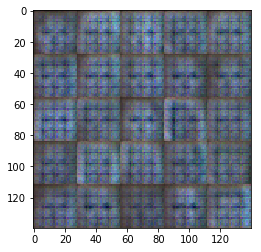

Epoch 1/1... Discriminator Loss: 0.6597... Generator Loss: 1.5038
Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 0.9831
Epoch 1/1... Discriminator Loss: 0.9942... Generator Loss: 0.7778
Epoch 1/1... Discriminator Loss: 0.7066... Generator Loss: 1.7582


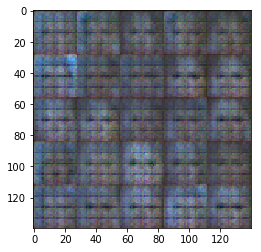

Epoch 1/1... Discriminator Loss: 0.8595... Generator Loss: 1.3490
Epoch 1/1... Discriminator Loss: 0.8238... Generator Loss: 1.1430
Epoch 1/1... Discriminator Loss: 0.8768... Generator Loss: 1.0553
Epoch 1/1... Discriminator Loss: 0.6209... Generator Loss: 1.6861


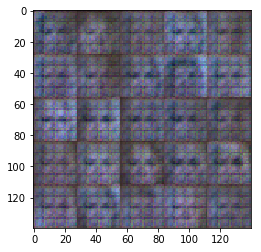

Epoch 1/1... Discriminator Loss: 0.6676... Generator Loss: 1.4740
Epoch 1/1... Discriminator Loss: 1.0995... Generator Loss: 0.5998
Epoch 1/1... Discriminator Loss: 0.5951... Generator Loss: 1.6562
Epoch 1/1... Discriminator Loss: 0.7881... Generator Loss: 2.1437


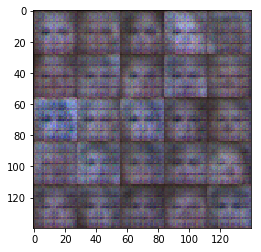

Epoch 1/1... Discriminator Loss: 0.7125... Generator Loss: 1.1250
Epoch 1/1... Discriminator Loss: 0.4561... Generator Loss: 2.1562
Epoch 1/1... Discriminator Loss: 0.7602... Generator Loss: 2.2556
Epoch 1/1... Discriminator Loss: 0.6668... Generator Loss: 1.3248


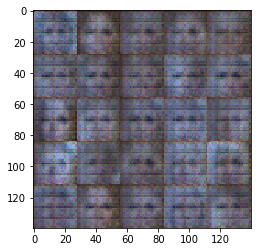

Epoch 1/1... Discriminator Loss: 0.8326... Generator Loss: 0.7597
Epoch 1/1... Discriminator Loss: 0.4828... Generator Loss: 1.5334
Epoch 1/1... Discriminator Loss: 0.7028... Generator Loss: 2.2531
Epoch 1/1... Discriminator Loss: 0.9690... Generator Loss: 3.1415


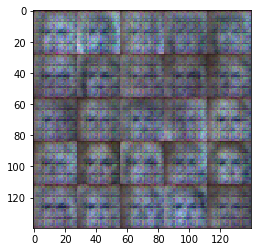

Epoch 1/1... Discriminator Loss: 0.5872... Generator Loss: 1.3029
Epoch 1/1... Discriminator Loss: 0.4574... Generator Loss: 2.5098
Epoch 1/1... Discriminator Loss: 0.5707... Generator Loss: 1.4749
Epoch 1/1... Discriminator Loss: 0.7266... Generator Loss: 1.0319


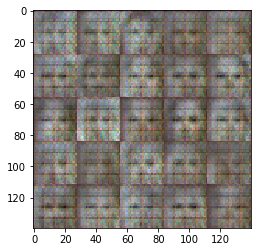

Epoch 1/1... Discriminator Loss: 0.5166... Generator Loss: 2.1188
Epoch 1/1... Discriminator Loss: 0.4745... Generator Loss: 1.9469
Epoch 1/1... Discriminator Loss: 0.5450... Generator Loss: 1.6520
Epoch 1/1... Discriminator Loss: 0.6019... Generator Loss: 1.2417


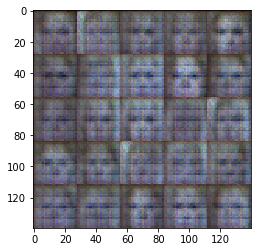

Epoch 1/1... Discriminator Loss: 0.5388... Generator Loss: 1.3768
Epoch 1/1... Discriminator Loss: 0.7263... Generator Loss: 1.2674
Epoch 1/1... Discriminator Loss: 0.7418... Generator Loss: 1.0132
Epoch 1/1... Discriminator Loss: 0.4015... Generator Loss: 1.9160


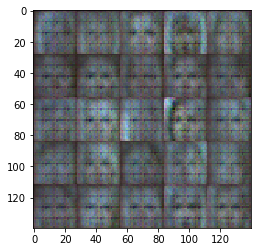

Epoch 1/1... Discriminator Loss: 0.5489... Generator Loss: 1.5933
Epoch 1/1... Discriminator Loss: 0.5593... Generator Loss: 3.2944
Epoch 1/1... Discriminator Loss: 0.4372... Generator Loss: 2.0323
Epoch 1/1... Discriminator Loss: 0.6776... Generator Loss: 3.2902


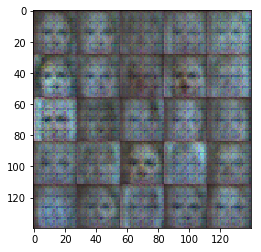

Epoch 1/1... Discriminator Loss: 0.7544... Generator Loss: 1.0519
Epoch 1/1... Discriminator Loss: 0.7154... Generator Loss: 2.5668
Epoch 1/1... Discriminator Loss: 0.9798... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 0.7805... Generator Loss: 0.8733


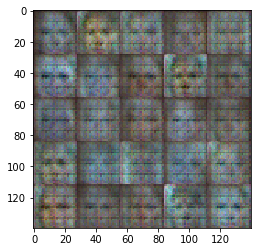

Epoch 1/1... Discriminator Loss: 0.5374... Generator Loss: 1.5642
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.5282
Epoch 1/1... Discriminator Loss: 0.3694... Generator Loss: 2.1626
Epoch 1/1... Discriminator Loss: 1.3293... Generator Loss: 0.4194


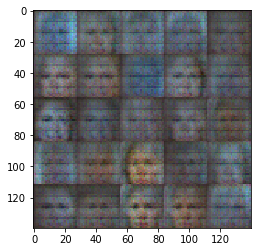

Epoch 1/1... Discriminator Loss: 0.4336... Generator Loss: 1.9664
Epoch 1/1... Discriminator Loss: 0.5512... Generator Loss: 1.4206
Epoch 1/1... Discriminator Loss: 0.5351... Generator Loss: 1.4554
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.4458


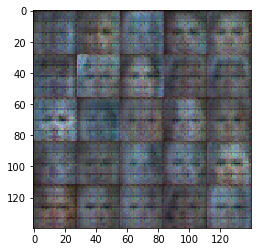

Epoch 1/1... Discriminator Loss: 0.6067... Generator Loss: 1.6518
Epoch 1/1... Discriminator Loss: 0.6581... Generator Loss: 2.0199
Epoch 1/1... Discriminator Loss: 0.6528... Generator Loss: 1.1190
Epoch 1/1... Discriminator Loss: 0.4190... Generator Loss: 2.1751


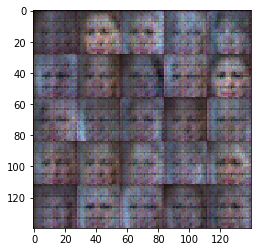

Epoch 1/1... Discriminator Loss: 0.9365... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 0.9594... Generator Loss: 0.7956
Epoch 1/1... Discriminator Loss: 0.4696... Generator Loss: 1.8649
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 0.5376


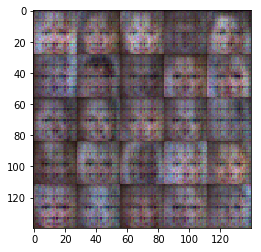

Epoch 1/1... Discriminator Loss: 0.4692... Generator Loss: 2.1132
Epoch 1/1... Discriminator Loss: 0.5414... Generator Loss: 1.4487
Epoch 1/1... Discriminator Loss: 0.5627... Generator Loss: 2.4972
Epoch 1/1... Discriminator Loss: 0.5605... Generator Loss: 1.5962


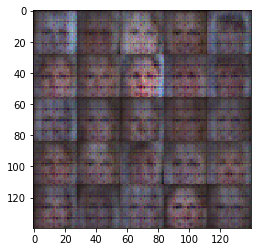

Epoch 1/1... Discriminator Loss: 0.4615... Generator Loss: 1.5341
Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 3.6069
Epoch 1/1... Discriminator Loss: 0.8476... Generator Loss: 0.8590
Epoch 1/1... Discriminator Loss: 0.6267... Generator Loss: 2.3330


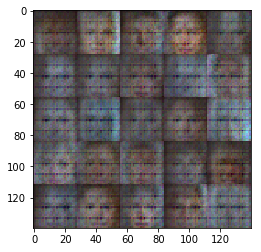

Epoch 1/1... Discriminator Loss: 0.5496... Generator Loss: 2.3108
Epoch 1/1... Discriminator Loss: 0.5330... Generator Loss: 2.3722
Epoch 1/1... Discriminator Loss: 0.6225... Generator Loss: 2.3520
Epoch 1/1... Discriminator Loss: 0.5825... Generator Loss: 1.3435


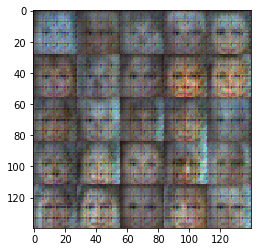

Epoch 1/1... Discriminator Loss: 0.8820... Generator Loss: 2.6572
Epoch 1/1... Discriminator Loss: 0.8035... Generator Loss: 2.2141
Epoch 1/1... Discriminator Loss: 0.7568... Generator Loss: 0.9094
Epoch 1/1... Discriminator Loss: 0.8319... Generator Loss: 2.2619


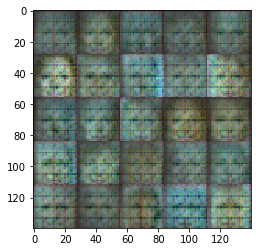

Epoch 1/1... Discriminator Loss: 0.6350... Generator Loss: 1.5967
Epoch 1/1... Discriminator Loss: 0.7479... Generator Loss: 2.5070
Epoch 1/1... Discriminator Loss: 0.8695... Generator Loss: 1.2169
Epoch 1/1... Discriminator Loss: 0.6027... Generator Loss: 1.4107


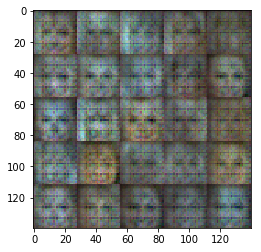

Epoch 1/1... Discriminator Loss: 0.5878... Generator Loss: 1.6965
Epoch 1/1... Discriminator Loss: 0.8606... Generator Loss: 0.9304
Epoch 1/1... Discriminator Loss: 0.6114... Generator Loss: 1.7305
Epoch 1/1... Discriminator Loss: 0.7467... Generator Loss: 1.1647


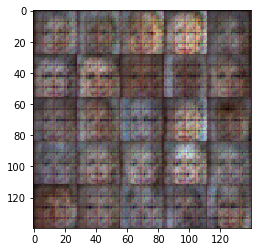

Epoch 1/1... Discriminator Loss: 0.7952... Generator Loss: 0.8702
Epoch 1/1... Discriminator Loss: 0.4941... Generator Loss: 1.6444
Epoch 1/1... Discriminator Loss: 0.5856... Generator Loss: 3.0320
Epoch 1/1... Discriminator Loss: 0.5262... Generator Loss: 1.6034


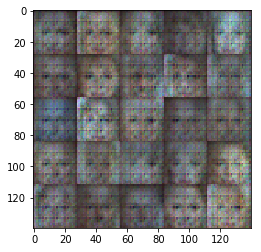

Epoch 1/1... Discriminator Loss: 0.5350... Generator Loss: 2.2779
Epoch 1/1... Discriminator Loss: 0.6978... Generator Loss: 3.2185
Epoch 1/1... Discriminator Loss: 0.7755... Generator Loss: 1.1048
Epoch 1/1... Discriminator Loss: 0.8686... Generator Loss: 0.9835


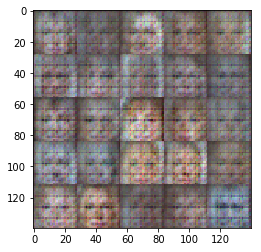

Epoch 1/1... Discriminator Loss: 0.7499... Generator Loss: 2.4479
Epoch 1/1... Discriminator Loss: 0.4859... Generator Loss: 1.6930
Epoch 1/1... Discriminator Loss: 0.7052... Generator Loss: 1.4280
Epoch 1/1... Discriminator Loss: 0.4781... Generator Loss: 2.2810


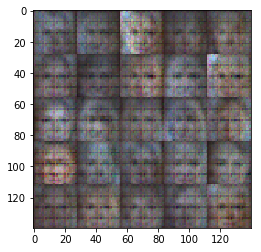

Epoch 1/1... Discriminator Loss: 0.4923... Generator Loss: 1.7585
Epoch 1/1... Discriminator Loss: 0.6147... Generator Loss: 3.6235
Epoch 1/1... Discriminator Loss: 0.5756... Generator Loss: 1.2278
Epoch 1/1... Discriminator Loss: 0.5205... Generator Loss: 1.8459


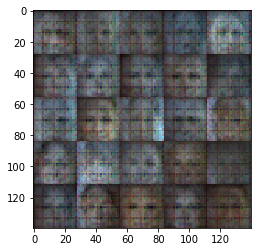

Epoch 1/1... Discriminator Loss: 0.6486... Generator Loss: 1.5808
Epoch 1/1... Discriminator Loss: 1.0195... Generator Loss: 0.6816
Epoch 1/1... Discriminator Loss: 0.7369... Generator Loss: 1.1420
Epoch 1/1... Discriminator Loss: 0.5753... Generator Loss: 1.3084


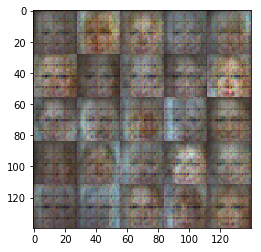

Epoch 1/1... Discriminator Loss: 0.7767... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 0.6954... Generator Loss: 1.0843
Epoch 1/1... Discriminator Loss: 0.6878... Generator Loss: 1.3389
Epoch 1/1... Discriminator Loss: 0.5648... Generator Loss: 1.4835


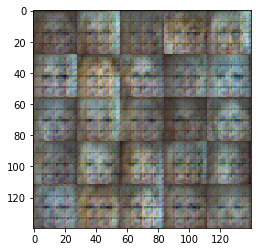

Epoch 1/1... Discriminator Loss: 0.5918... Generator Loss: 1.9632
Epoch 1/1... Discriminator Loss: 0.4775... Generator Loss: 1.5878
Epoch 1/1... Discriminator Loss: 0.4520... Generator Loss: 1.8446
Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.4794


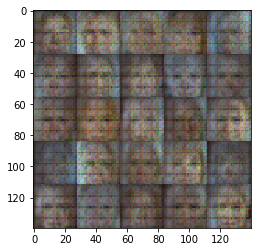

Epoch 1/1... Discriminator Loss: 0.5733... Generator Loss: 1.6068
Epoch 1/1... Discriminator Loss: 0.7170... Generator Loss: 2.5148
Epoch 1/1... Discriminator Loss: 1.0906... Generator Loss: 2.9818
Epoch 1/1... Discriminator Loss: 0.7191... Generator Loss: 1.2298


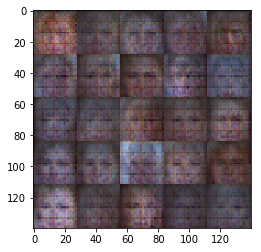

Epoch 1/1... Discriminator Loss: 0.5836... Generator Loss: 1.3782
Epoch 1/1... Discriminator Loss: 0.4840... Generator Loss: 1.8732
Epoch 1/1... Discriminator Loss: 0.5987... Generator Loss: 1.2148
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.5285


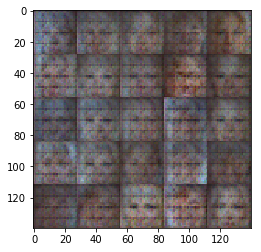

Epoch 1/1... Discriminator Loss: 0.5756... Generator Loss: 1.7763
Epoch 1/1... Discriminator Loss: 0.7424... Generator Loss: 2.5187
Epoch 1/1... Discriminator Loss: 0.5566... Generator Loss: 1.3039
Epoch 1/1... Discriminator Loss: 0.7837... Generator Loss: 2.0699


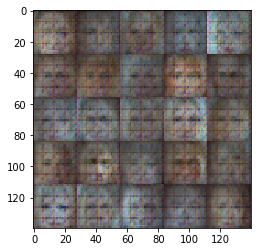

Epoch 1/1... Discriminator Loss: 1.0000... Generator Loss: 0.6317
Epoch 1/1... Discriminator Loss: 0.5354... Generator Loss: 1.4682
Epoch 1/1... Discriminator Loss: 0.5934... Generator Loss: 1.4134
Epoch 1/1... Discriminator Loss: 0.6915... Generator Loss: 0.9912


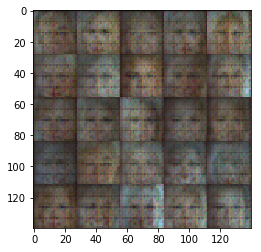

Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 0.6929... Generator Loss: 1.2057
Epoch 1/1... Discriminator Loss: 0.8722... Generator Loss: 2.2962
Epoch 1/1... Discriminator Loss: 0.6043... Generator Loss: 1.2391


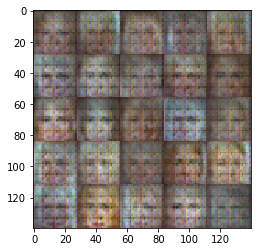

Epoch 1/1... Discriminator Loss: 0.6604... Generator Loss: 1.1294
Epoch 1/1... Discriminator Loss: 0.7491... Generator Loss: 0.9751
Epoch 1/1... Discriminator Loss: 0.5729... Generator Loss: 1.8834
Epoch 1/1... Discriminator Loss: 0.5111... Generator Loss: 2.8714


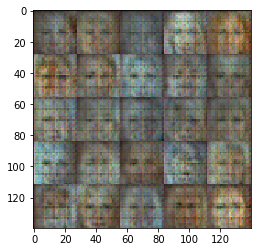

Epoch 1/1... Discriminator Loss: 0.5774... Generator Loss: 1.5451
Epoch 1/1... Discriminator Loss: 0.5063... Generator Loss: 1.5451
Epoch 1/1... Discriminator Loss: 0.6314... Generator Loss: 1.3106
Epoch 1/1... Discriminator Loss: 0.5913... Generator Loss: 2.5185


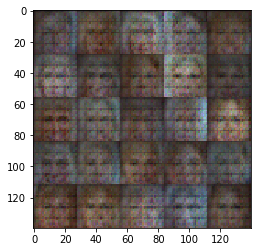

Epoch 1/1... Discriminator Loss: 0.6819... Generator Loss: 2.4066
Epoch 1/1... Discriminator Loss: 0.7167... Generator Loss: 1.8382
Epoch 1/1... Discriminator Loss: 0.5683... Generator Loss: 1.4739
Epoch 1/1... Discriminator Loss: 0.5161... Generator Loss: 1.6974


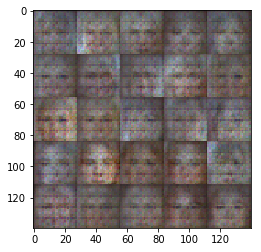

Epoch 1/1... Discriminator Loss: 0.5798... Generator Loss: 1.8148
Epoch 1/1... Discriminator Loss: 0.8026... Generator Loss: 2.1409
Epoch 1/1... Discriminator Loss: 0.6096... Generator Loss: 1.2459
Epoch 1/1... Discriminator Loss: 0.6758... Generator Loss: 1.2139


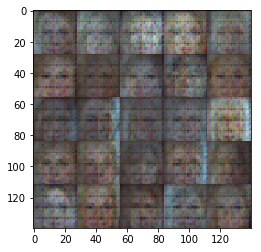

Epoch 1/1... Discriminator Loss: 0.7087... Generator Loss: 1.1169
Epoch 1/1... Discriminator Loss: 1.5718... Generator Loss: 0.3295
Epoch 1/1... Discriminator Loss: 0.5765... Generator Loss: 1.5938
Epoch 1/1... Discriminator Loss: 0.8464... Generator Loss: 1.9530


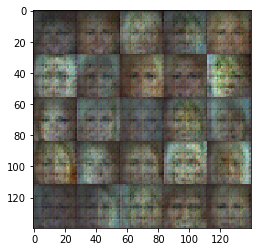

Epoch 1/1... Discriminator Loss: 0.5203... Generator Loss: 1.6062
Epoch 1/1... Discriminator Loss: 0.5261... Generator Loss: 1.6309
Epoch 1/1... Discriminator Loss: 0.4763... Generator Loss: 1.5345
Epoch 1/1... Discriminator Loss: 0.5883... Generator Loss: 2.6775


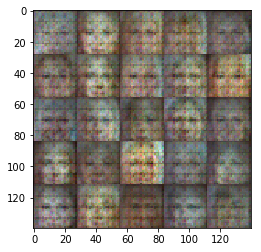

Epoch 1/1... Discriminator Loss: 0.4596... Generator Loss: 1.5708
Epoch 1/1... Discriminator Loss: 1.0978... Generator Loss: 0.5778
Epoch 1/1... Discriminator Loss: 0.5786... Generator Loss: 1.4174
Epoch 1/1... Discriminator Loss: 0.7619... Generator Loss: 1.1526


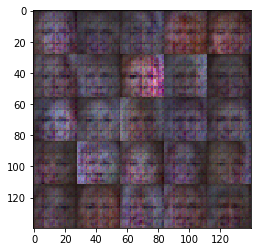

Epoch 1/1... Discriminator Loss: 0.6943... Generator Loss: 2.4833
Epoch 1/1... Discriminator Loss: 0.6833... Generator Loss: 2.3322
Epoch 1/1... Discriminator Loss: 0.4152... Generator Loss: 1.6815
Epoch 1/1... Discriminator Loss: 0.6747... Generator Loss: 1.0733


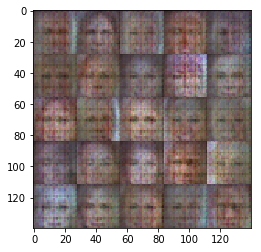

Epoch 1/1... Discriminator Loss: 1.0734... Generator Loss: 0.6003
Epoch 1/1... Discriminator Loss: 0.6702... Generator Loss: 1.3734
Epoch 1/1... Discriminator Loss: 0.6298... Generator Loss: 1.4157
Epoch 1/1... Discriminator Loss: 0.6697... Generator Loss: 1.3190


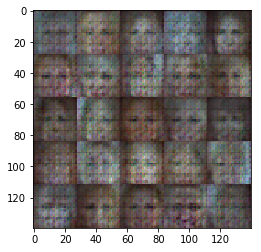

Epoch 1/1... Discriminator Loss: 0.6283... Generator Loss: 1.5347
Epoch 1/1... Discriminator Loss: 0.9815... Generator Loss: 2.9229
Epoch 1/1... Discriminator Loss: 0.9172... Generator Loss: 0.7793
Epoch 1/1... Discriminator Loss: 0.8066... Generator Loss: 0.9914


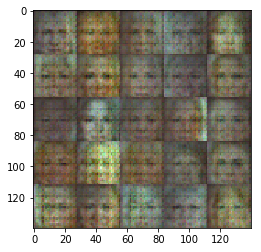

Epoch 1/1... Discriminator Loss: 0.5485... Generator Loss: 1.9626
Epoch 1/1... Discriminator Loss: 0.6243... Generator Loss: 1.4111
Epoch 1/1... Discriminator Loss: 0.4702... Generator Loss: 1.9107
Epoch 1/1... Discriminator Loss: 0.5489... Generator Loss: 2.2742


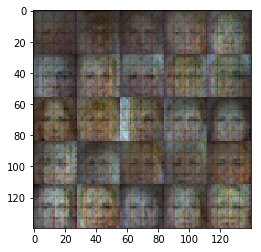

Epoch 1/1... Discriminator Loss: 0.7414... Generator Loss: 2.0195
Epoch 1/1... Discriminator Loss: 0.7010... Generator Loss: 1.0428
Epoch 1/1... Discriminator Loss: 0.5933... Generator Loss: 1.3509
Epoch 1/1... Discriminator Loss: 0.7127... Generator Loss: 1.1781


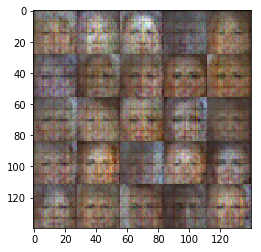

Epoch 1/1... Discriminator Loss: 0.9781... Generator Loss: 0.7425
Epoch 1/1... Discriminator Loss: 0.9666... Generator Loss: 1.2601
Epoch 1/1... Discriminator Loss: 0.6020... Generator Loss: 1.3665
Epoch 1/1... Discriminator Loss: 0.6097... Generator Loss: 1.4757


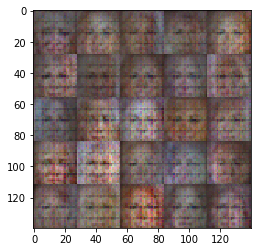

Epoch 1/1... Discriminator Loss: 0.8005... Generator Loss: 0.9553
Epoch 1/1... Discriminator Loss: 0.7557... Generator Loss: 1.0792
Epoch 1/1... Discriminator Loss: 0.6531... Generator Loss: 1.6563
Epoch 1/1... Discriminator Loss: 0.4809... Generator Loss: 1.7542


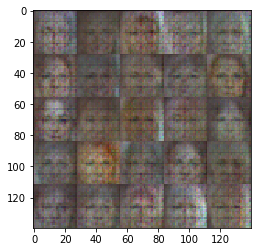

Epoch 1/1... Discriminator Loss: 1.1282... Generator Loss: 2.9464
Epoch 1/1... Discriminator Loss: 0.7344... Generator Loss: 1.1580
Epoch 1/1... Discriminator Loss: 0.6461... Generator Loss: 1.4638
Epoch 1/1... Discriminator Loss: 0.6683... Generator Loss: 1.1578


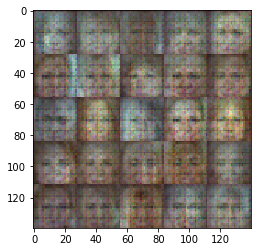

Epoch 1/1... Discriminator Loss: 0.6278... Generator Loss: 2.1249
Epoch 1/1... Discriminator Loss: 0.7140... Generator Loss: 1.8518
Epoch 1/1... Discriminator Loss: 0.7319... Generator Loss: 1.0367
Epoch 1/1... Discriminator Loss: 0.6316... Generator Loss: 1.2340


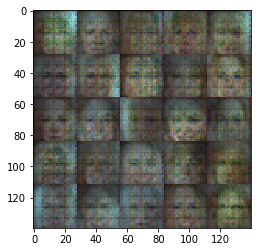

Epoch 1/1... Discriminator Loss: 0.6717... Generator Loss: 1.1815
Epoch 1/1... Discriminator Loss: 1.0182... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 0.6889... Generator Loss: 1.8544
Epoch 1/1... Discriminator Loss: 0.6530... Generator Loss: 1.8885


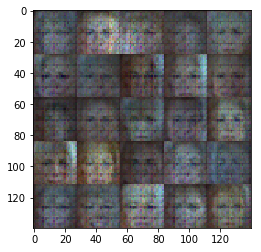

Epoch 1/1... Discriminator Loss: 0.5960... Generator Loss: 1.7247
Epoch 1/1... Discriminator Loss: 0.9145... Generator Loss: 0.7486
Epoch 1/1... Discriminator Loss: 0.7275... Generator Loss: 1.5534
Epoch 1/1... Discriminator Loss: 0.6310... Generator Loss: 1.3200


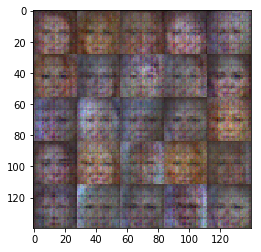

Epoch 1/1... Discriminator Loss: 0.8000... Generator Loss: 1.0389
Epoch 1/1... Discriminator Loss: 0.6118... Generator Loss: 1.2946
Epoch 1/1... Discriminator Loss: 0.6145... Generator Loss: 1.0864
Epoch 1/1... Discriminator Loss: 0.5908... Generator Loss: 1.6099


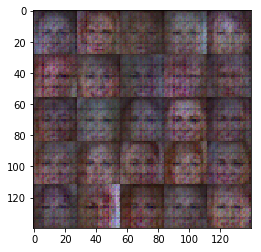

Epoch 1/1... Discriminator Loss: 1.2835... Generator Loss: 2.7194
Epoch 1/1... Discriminator Loss: 0.5391... Generator Loss: 1.3882
Epoch 1/1... Discriminator Loss: 0.6930... Generator Loss: 1.2043
Epoch 1/1... Discriminator Loss: 1.1731... Generator Loss: 0.5293


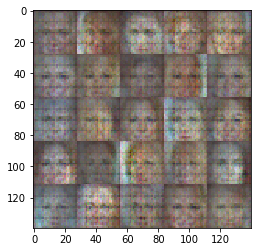

Epoch 1/1... Discriminator Loss: 0.7777... Generator Loss: 1.7415
Epoch 1/1... Discriminator Loss: 0.6386... Generator Loss: 1.4443
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 3.3834
Epoch 1/1... Discriminator Loss: 0.7441... Generator Loss: 1.1135


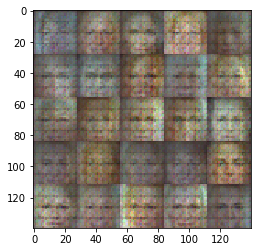

Epoch 1/1... Discriminator Loss: 0.6340... Generator Loss: 1.2243
Epoch 1/1... Discriminator Loss: 0.6667... Generator Loss: 1.1642
Epoch 1/1... Discriminator Loss: 0.7240... Generator Loss: 1.0528
Epoch 1/1... Discriminator Loss: 0.6813... Generator Loss: 1.0974


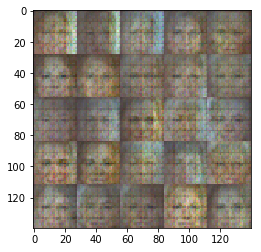

Epoch 1/1... Discriminator Loss: 0.5039... Generator Loss: 2.0762
Epoch 1/1... Discriminator Loss: 0.5508... Generator Loss: 2.4604
Epoch 1/1... Discriminator Loss: 0.7861... Generator Loss: 1.1160
Epoch 1/1... Discriminator Loss: 0.6007... Generator Loss: 1.4260


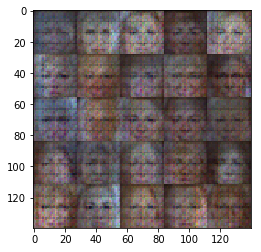

Epoch 1/1... Discriminator Loss: 0.7438... Generator Loss: 1.1296
Epoch 1/1... Discriminator Loss: 0.7395... Generator Loss: 1.9264
Epoch 1/1... Discriminator Loss: 0.7552... Generator Loss: 1.0611
Epoch 1/1... Discriminator Loss: 0.4454... Generator Loss: 1.8229


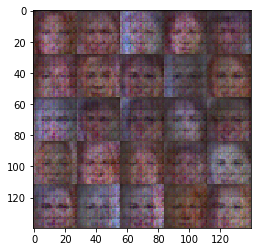

Epoch 1/1... Discriminator Loss: 0.8819... Generator Loss: 3.1372
Epoch 1/1... Discriminator Loss: 0.5701... Generator Loss: 1.4647
Epoch 1/1... Discriminator Loss: 0.5690... Generator Loss: 1.4146
Epoch 1/1... Discriminator Loss: 0.8029... Generator Loss: 2.3352


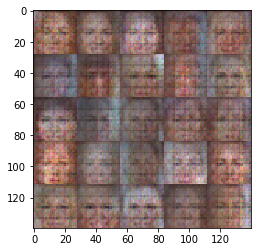

Epoch 1/1... Discriminator Loss: 0.7089... Generator Loss: 1.4487
Epoch 1/1... Discriminator Loss: 0.6058... Generator Loss: 2.2555
Epoch 1/1... Discriminator Loss: 0.7569... Generator Loss: 0.9224
Epoch 1/1... Discriminator Loss: 0.5079... Generator Loss: 2.2100


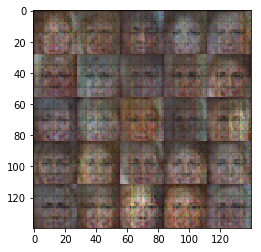

Epoch 1/1... Discriminator Loss: 0.8730... Generator Loss: 1.8019
Epoch 1/1... Discriminator Loss: 0.8363... Generator Loss: 2.3367
Epoch 1/1... Discriminator Loss: 0.8156... Generator Loss: 1.1212
Epoch 1/1... Discriminator Loss: 0.7247... Generator Loss: 1.3879


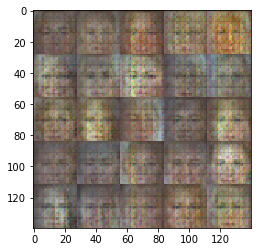

Epoch 1/1... Discriminator Loss: 0.6911... Generator Loss: 1.7879
Epoch 1/1... Discriminator Loss: 0.6492... Generator Loss: 1.2188
Epoch 1/1... Discriminator Loss: 0.9066... Generator Loss: 0.7554
Epoch 1/1... Discriminator Loss: 0.6446... Generator Loss: 1.5488


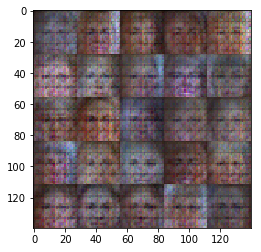

Epoch 1/1... Discriminator Loss: 0.7342... Generator Loss: 0.9514
Epoch 1/1... Discriminator Loss: 0.6384... Generator Loss: 1.9390
Epoch 1/1... Discriminator Loss: 0.7750... Generator Loss: 0.9934
Epoch 1/1... Discriminator Loss: 0.6744... Generator Loss: 2.1067


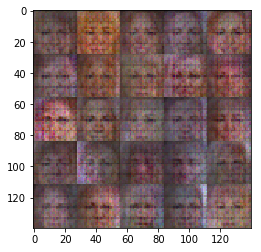

Epoch 1/1... Discriminator Loss: 0.7150... Generator Loss: 0.9409
Epoch 1/1... Discriminator Loss: 0.6160... Generator Loss: 2.0952
Epoch 1/1... Discriminator Loss: 0.5363... Generator Loss: 1.3194
Epoch 1/1... Discriminator Loss: 0.7682... Generator Loss: 2.9683


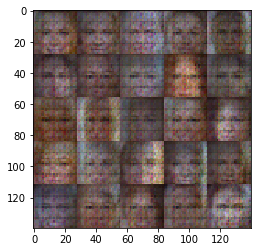

Epoch 1/1... Discriminator Loss: 0.6230... Generator Loss: 1.3203
Epoch 1/1... Discriminator Loss: 0.7448... Generator Loss: 1.2246
Epoch 1/1... Discriminator Loss: 0.7757... Generator Loss: 1.0281
Epoch 1/1... Discriminator Loss: 0.6583... Generator Loss: 1.4468


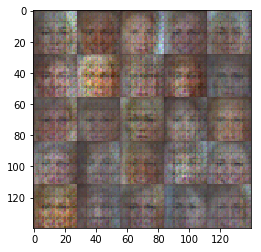

Epoch 1/1... Discriminator Loss: 0.6361... Generator Loss: 1.7423
Epoch 1/1... Discriminator Loss: 0.9282... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 0.7247... Generator Loss: 1.9169
Epoch 1/1... Discriminator Loss: 0.6096... Generator Loss: 1.2077


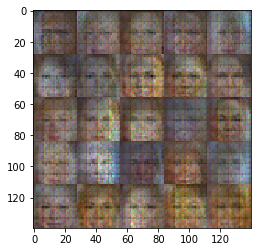

Epoch 1/1... Discriminator Loss: 0.5915... Generator Loss: 1.9498
Epoch 1/1... Discriminator Loss: 0.6184... Generator Loss: 1.2900
Epoch 1/1... Discriminator Loss: 0.5145... Generator Loss: 1.6417
Epoch 1/1... Discriminator Loss: 0.5536... Generator Loss: 1.5060


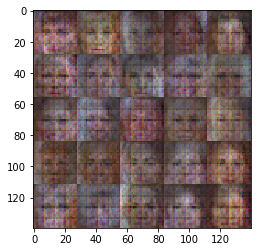

Epoch 1/1... Discriminator Loss: 1.2591... Generator Loss: 2.6910
Epoch 1/1... Discriminator Loss: 1.0665... Generator Loss: 0.6233
Epoch 1/1... Discriminator Loss: 0.7752... Generator Loss: 0.9475
Epoch 1/1... Discriminator Loss: 0.6170... Generator Loss: 2.0946


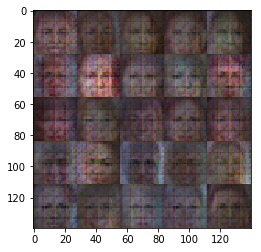

Epoch 1/1... Discriminator Loss: 0.6245... Generator Loss: 1.1779
Epoch 1/1... Discriminator Loss: 0.5016... Generator Loss: 1.8086
Epoch 1/1... Discriminator Loss: 0.6919... Generator Loss: 1.2454
Epoch 1/1... Discriminator Loss: 0.9252... Generator Loss: 0.7149


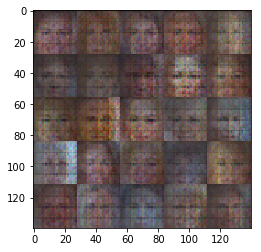

Epoch 1/1... Discriminator Loss: 0.6212... Generator Loss: 1.9131
Epoch 1/1... Discriminator Loss: 0.7855... Generator Loss: 0.8562
Epoch 1/1... Discriminator Loss: 0.6313... Generator Loss: 1.4756
Epoch 1/1... Discriminator Loss: 1.0425... Generator Loss: 0.5981


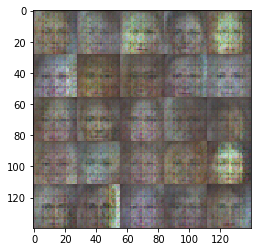

Epoch 1/1... Discriminator Loss: 0.6010... Generator Loss: 1.9483
Epoch 1/1... Discriminator Loss: 0.4857... Generator Loss: 2.6607
Epoch 1/1... Discriminator Loss: 0.7884... Generator Loss: 0.8930
Epoch 1/1... Discriminator Loss: 0.7452... Generator Loss: 0.9924


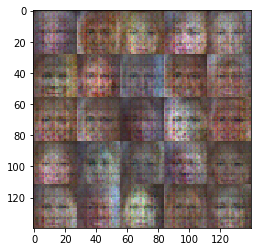

Epoch 1/1... Discriminator Loss: 0.7248... Generator Loss: 1.0213
Epoch 1/1... Discriminator Loss: 0.7039... Generator Loss: 1.9039
Epoch 1/1... Discriminator Loss: 0.6800... Generator Loss: 1.5762
Epoch 1/1... Discriminator Loss: 1.1184... Generator Loss: 0.5402


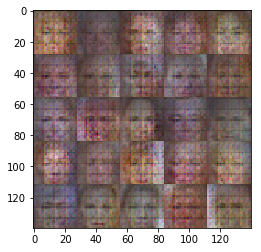

Epoch 1/1... Discriminator Loss: 0.8927... Generator Loss: 2.3197
Epoch 1/1... Discriminator Loss: 0.8754... Generator Loss: 0.8442
Epoch 1/1... Discriminator Loss: 0.6500... Generator Loss: 1.1138
Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 1.4179


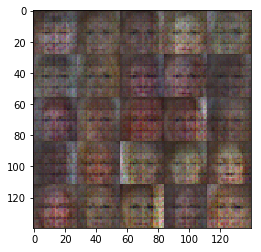

Epoch 1/1... Discriminator Loss: 0.6424... Generator Loss: 1.3963
Epoch 1/1... Discriminator Loss: 0.6026... Generator Loss: 1.2397
Epoch 1/1... Discriminator Loss: 0.9100... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 0.8200... Generator Loss: 2.5621


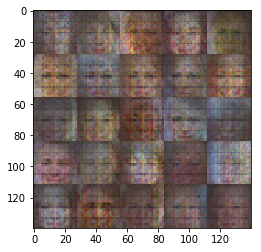

Epoch 1/1... Discriminator Loss: 0.9028... Generator Loss: 0.7893
Epoch 1/1... Discriminator Loss: 0.6794... Generator Loss: 1.7710
Epoch 1/1... Discriminator Loss: 0.8347... Generator Loss: 0.8963
Epoch 1/1... Discriminator Loss: 0.7746... Generator Loss: 1.9106


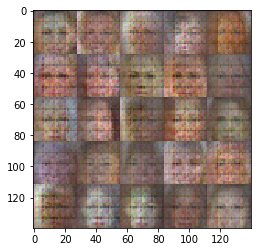

Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 0.6080
Epoch 1/1... Discriminator Loss: 0.6201... Generator Loss: 1.4665
Epoch 1/1... Discriminator Loss: 0.5956... Generator Loss: 1.4878


In [84]:
batch_size = 128
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.